In [1]:
import pandas as pd
from matplotlib import pyplot as plt
from IPython.display import display, Math
import numpy as np

countries = ['AT', 'BE', 'CZ', 'DE_LU', 'FR', 'HR', 'HU', 'NL', 'PL', 'RO', 'SI', 'SK']
non_fbmc_countries = ['CH', 'GB', 'ES', 'IT_NORD']

forecast_legend = [
    r'$\mathrm{IO_{L1}}$', 
    r'$\mathrm{IO_{L1}}$ + $\mathrm{IO_{d}}$', 
    r'$\mathrm{IO_{L2}}$', 
    r'$\mathrm{IO_{L2}}$ + $\mathrm{IO_{d}}$',
]

forecast_legend_alpha = [
    r'$\alpha$ = 10%',
    r'$\alpha$ = 5%',
    r'$\alpha$ = 4%',
    'tso selection'
]

In [2]:
df_observed = pd.read_excel("./data/day_ahead_prices.xlsx", index_col=0)
df_observed_non_fbmc = pd.read_excel("./data/day_ahead_prices_non_fbmc.xlsx", index_col=0)

# November
start_date_nov = pd.Timestamp('20221101')
end_date_nov = pd.Timestamp('20221201')

# February
start_date_feb = pd.Timestamp('20230201')
end_date_feb = pd.Timestamp('20230301')

df_observed_november = df_observed.loc[(df_observed.index > start_date_nov) & (df_observed.index <= end_date_nov)]
df_observed_non_fbmc_november = df_observed_non_fbmc.loc[(df_observed_non_fbmc.index > start_date_nov) & (df_observed_non_fbmc.index <= end_date_nov)]

df_observed_february = df_observed.loc[(df_observed.index > start_date_feb) & (df_observed.index <= end_date_feb)]
df_observed_non_fbmc_february = df_observed_non_fbmc.loc[(df_observed_non_fbmc.index > start_date_feb) & (df_observed_non_fbmc.index <= end_date_feb)]

df_forecasts_november = []
df_forecasts_february = []

df_forecasts_november.append(pd.read_excel("./price_forecasts/price_forecast_norm_1_w_atc_november.xlsx"))
df_forecasts_november.append(pd.read_excel("./price_forecasts/price_forecast_norm_1_duality_gap_w_atc_november.xlsx"))
df_forecasts_november.append(pd.read_excel("./price_forecasts/price_forecast_norm_2_w_atc_november.xlsx"))
df_forecasts_november.append(pd.read_excel("./price_forecasts/price_forecast_norm_2_duality_gap_w_atc_november.xlsx"))

df_forecasts_february.append(pd.read_excel("./price_forecasts/price_forecast_norm_1_w_atc_february.xlsx"))
df_forecasts_february.append(pd.read_excel("./price_forecasts/price_forecast_norm_1_duality_gap_w_atc_february.xlsx"))
df_forecasts_february.append(pd.read_excel("./price_forecasts/price_forecast_norm_2_w_atc_february.xlsx"))
df_forecasts_february.append(pd.read_excel("./price_forecasts/price_forecast_norm_2_duality_gap_w_atc_february.xlsx"))
df_forecasts_february.append(pd.read_excel("./price_forecasts/volue_day_ahead_ec00.xlsx", index_col=0))

df_forecasts_february.append(pd.read_excel("./price_forecasts/price_forecast_full_norm_1_w_atc_february.xlsx"))
df_forecasts_february.append(pd.read_excel("./price_forecasts/price_forecast_full_nuts_norm_1_w_atc_february.xlsx"))
df_forecasts_february.append(pd.read_excel("./price_forecasts/price_forecast_full_naive_norm_1_w_atc_february.xlsx"))
df_forecasts_february.append(pd.read_excel("./price_forecasts/price_forecast_full_alpha5_norm_1_w_atc_february.xlsx"))
df_forecasts_february.append(pd.read_excel("./price_forecasts/price_forecast_basic_a10_norm_1_w_atc_february.xlsx"))

df_forecasts_february_alpha = []
df_forecasts_february_alpha.append(pd.read_excel("./price_forecasts/price_forecast_full_nuts_norm_1_w_atc_february.xlsx"))
df_forecasts_february_alpha.append(pd.read_excel("./price_forecasts/price_forecast_full_alpha5_norm_1_w_atc_february.xlsx"))
df_forecasts_february_alpha.append(pd.read_excel("./price_forecasts/price_forecast_full_alpha4_norm_1_w_atc_february.xlsx"))
df_forecasts_february_alpha.append(pd.read_excel("./price_forecasts/price_forecast_full_tso_norm_1_w_atc_february.xlsx"))
df_forecasts_february_alpha.append(pd.read_excel("./price_forecasts/price_forecast_full_naive_norm_1_w_atc_february.xlsx"))

for index, df in enumerate(df_forecasts_november):
    df_forecasts_november[index].index = df_observed_november.index
    
for index, df in enumerate(df_forecasts_february):
    df_forecasts_february[index].index = df_observed_february.index
    
for index, df in enumerate(df_forecasts_february_alpha):
    df_forecasts_february_alpha[index].index = df_observed_february.index

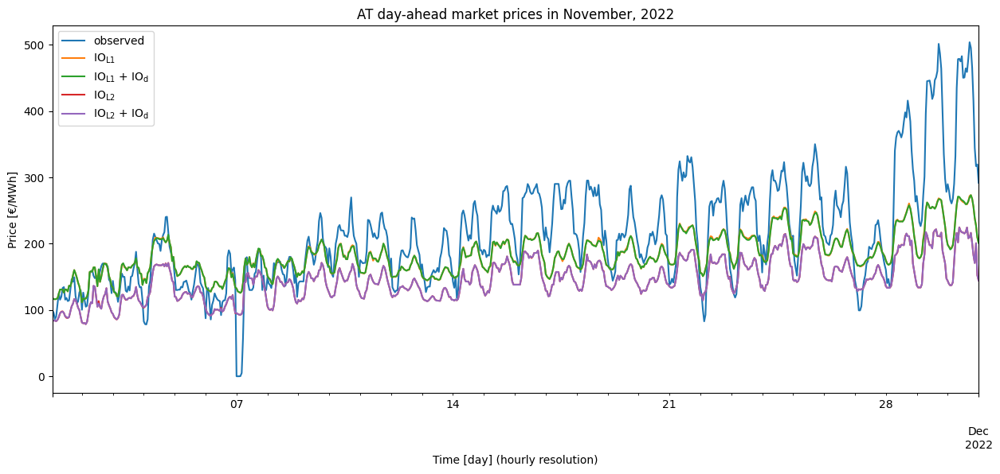

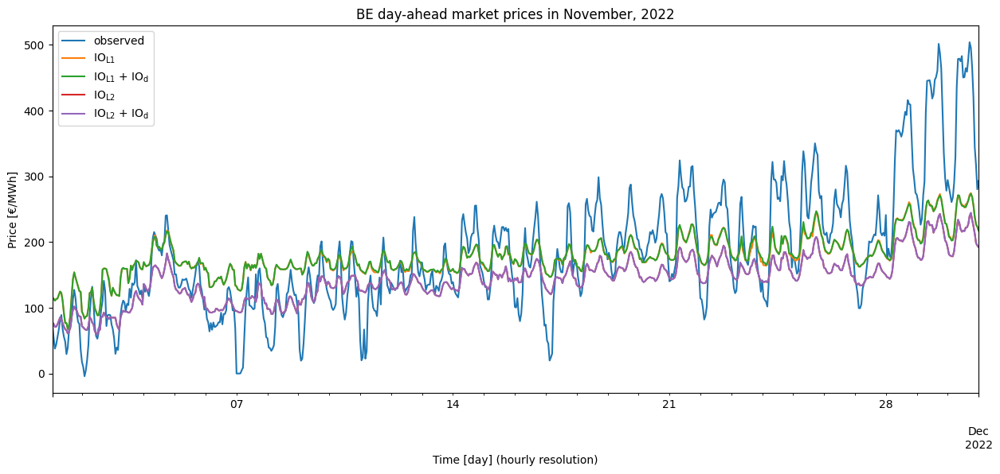

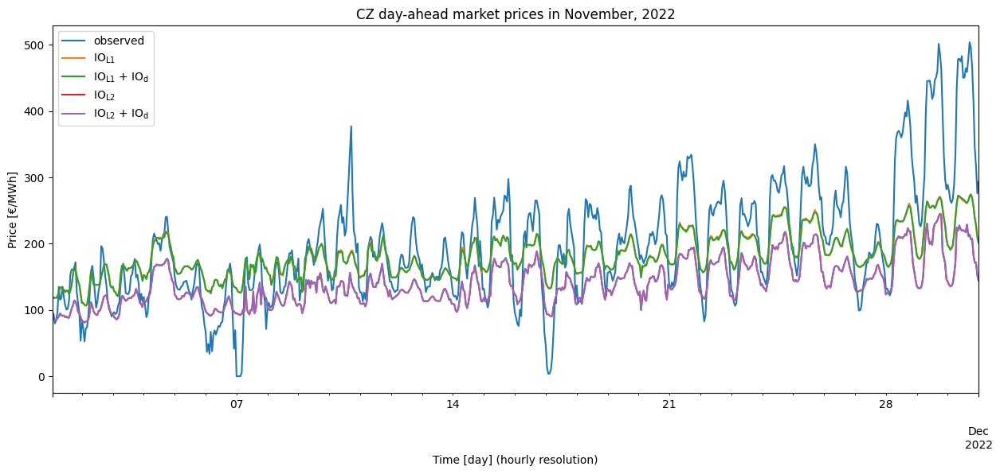

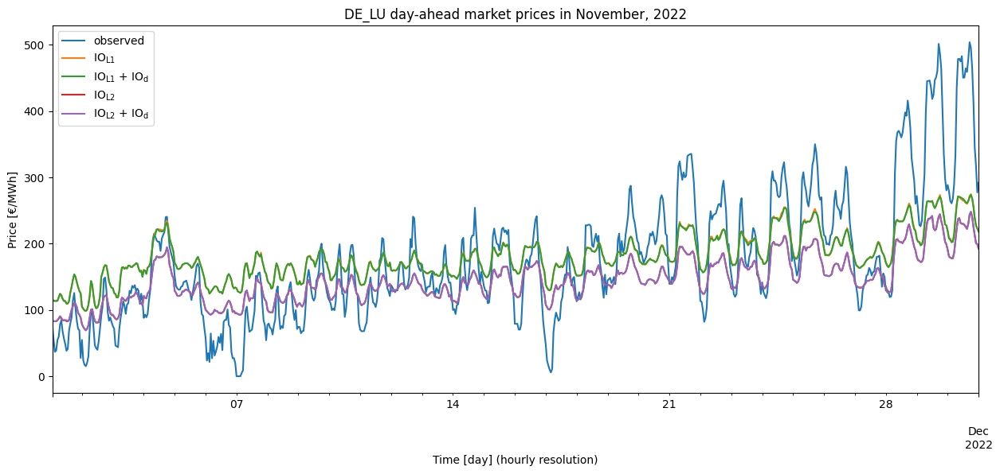

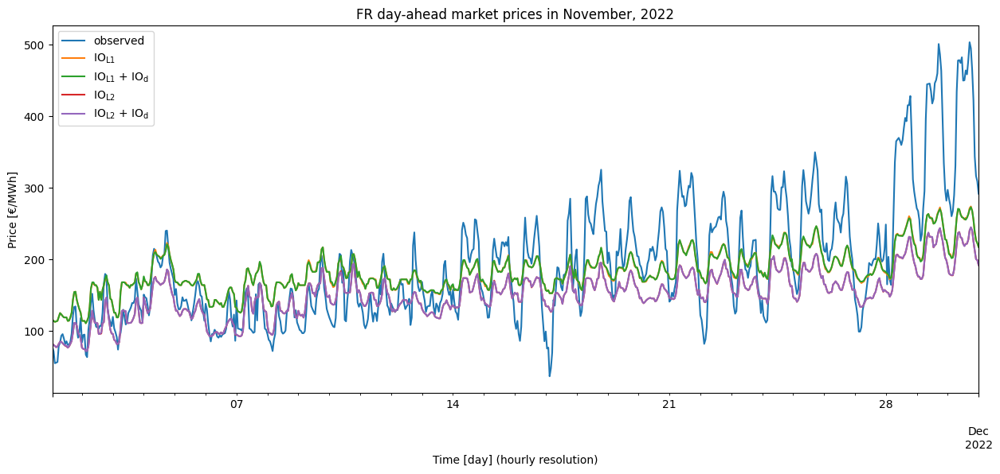

...

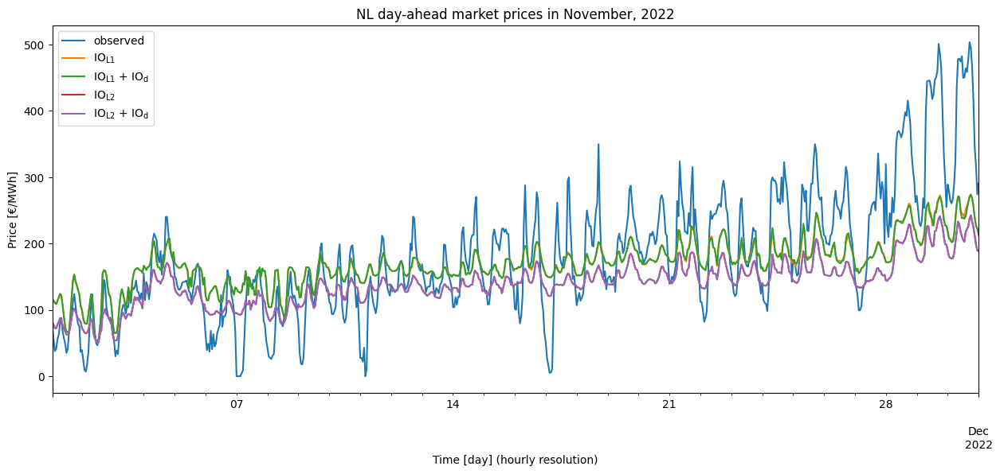

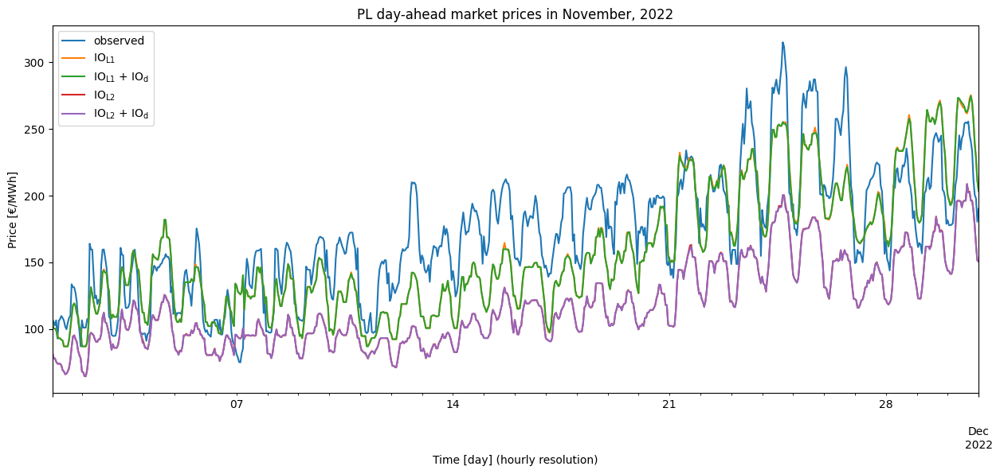

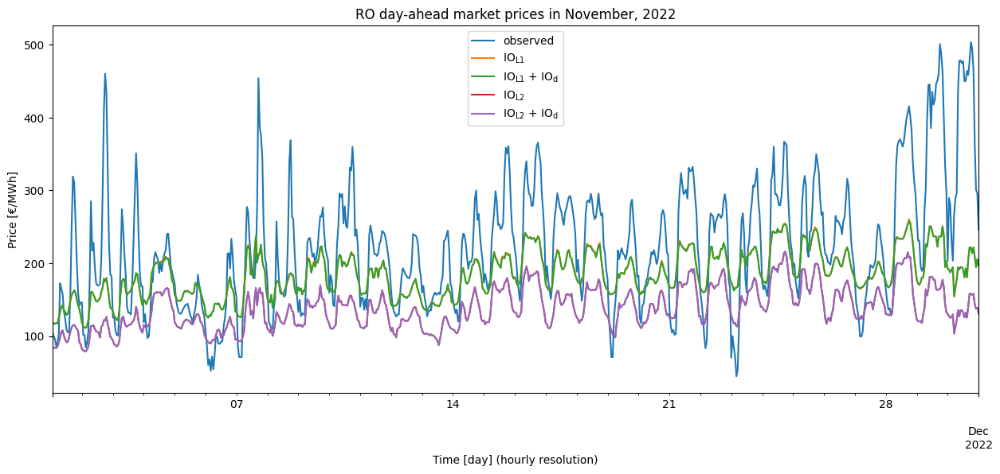

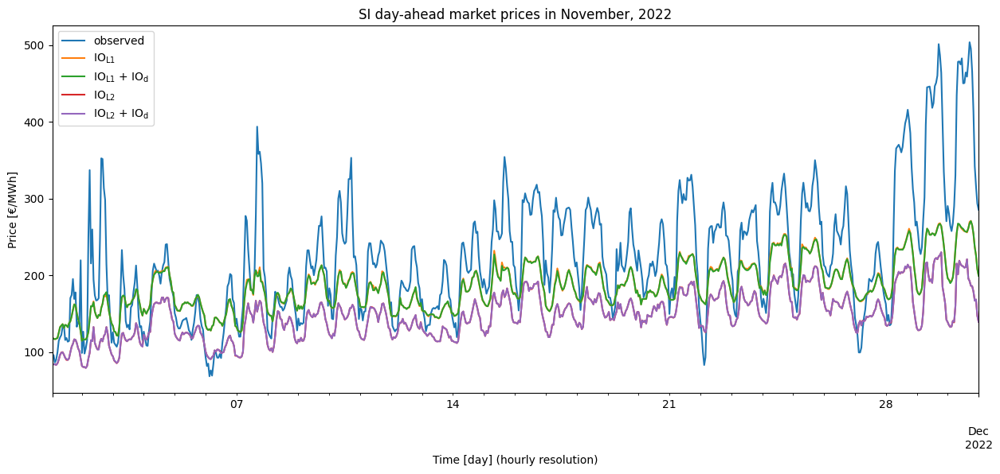

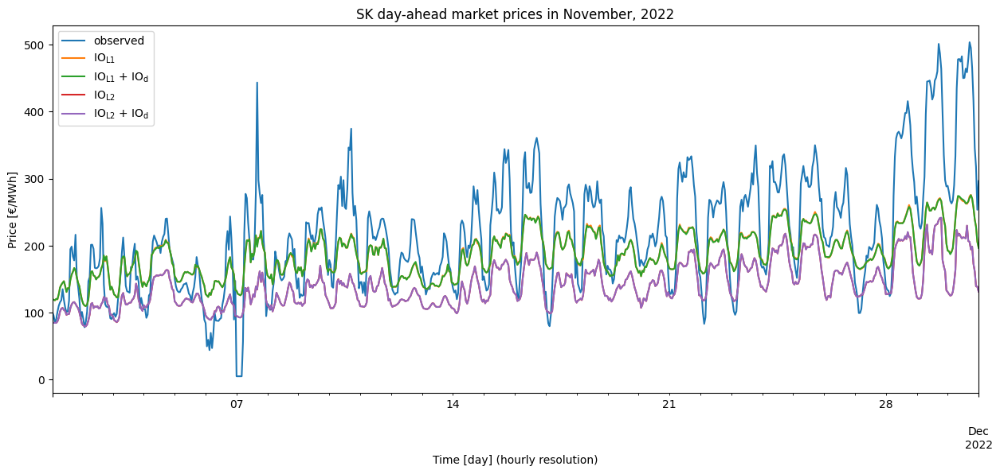

In [23]:
for zone in countries:
    plt.figure(figsize=(15,6))
    ax = df_observed_november[zone].plot()
    for df in df_forecasts_november:
        df[zone].plot(ax=ax)
    
    plt.title("{0} day-ahead market prices in November, 2022".format(zone))
    plt.ylabel('Price [€/MWh]')
    plt.xlabel('Time [day] (hourly resolution)')
    ax.legend(['observed'] + forecast_legend)
    plt.show()

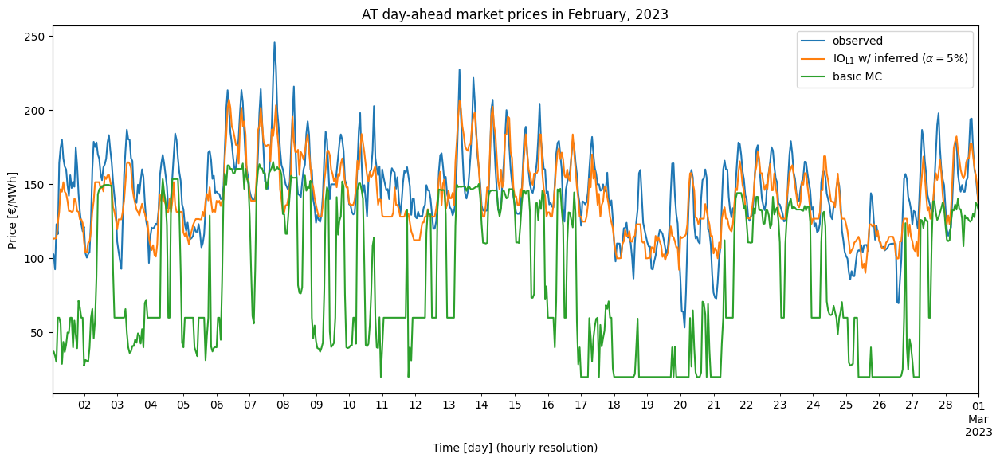

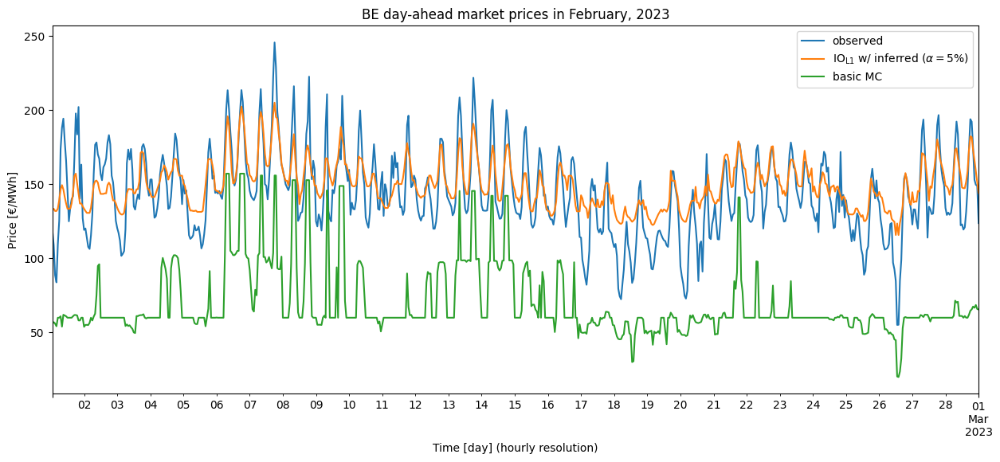

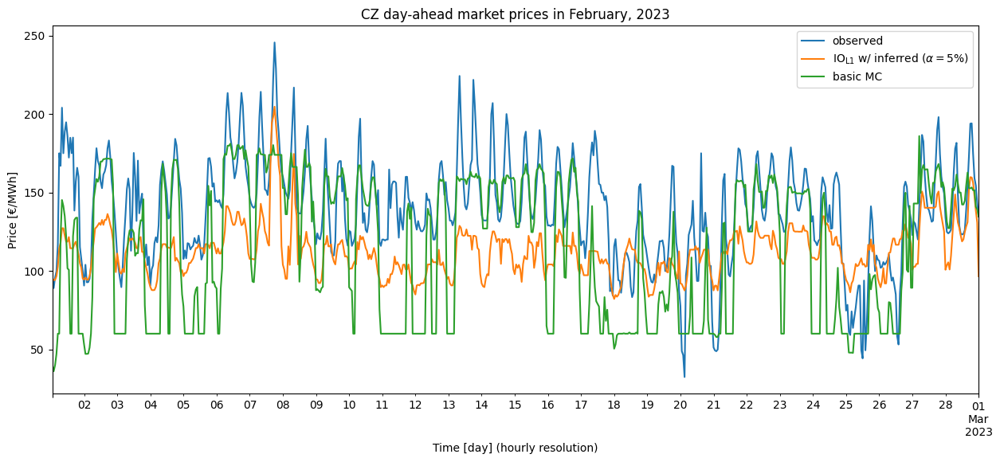

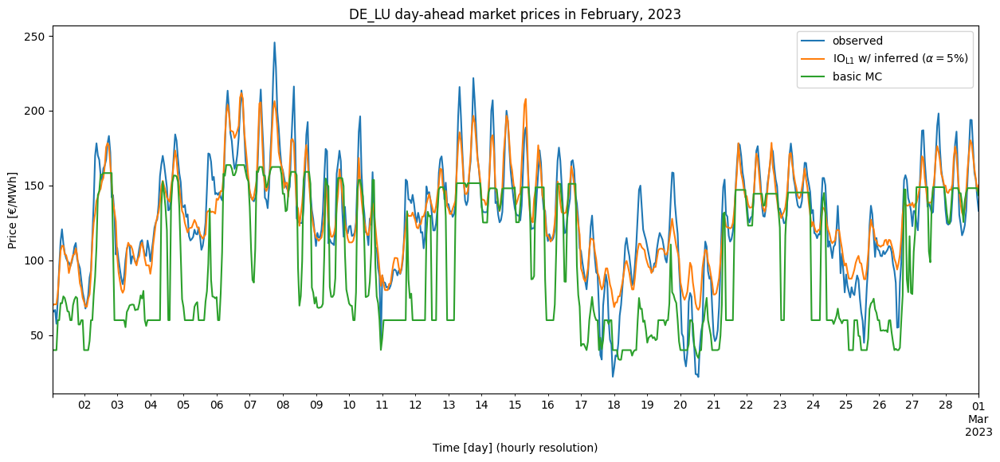

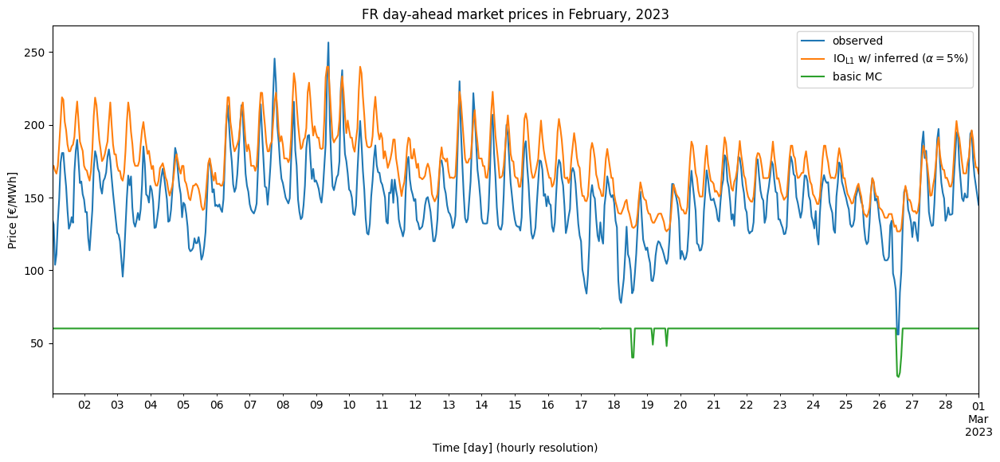

...

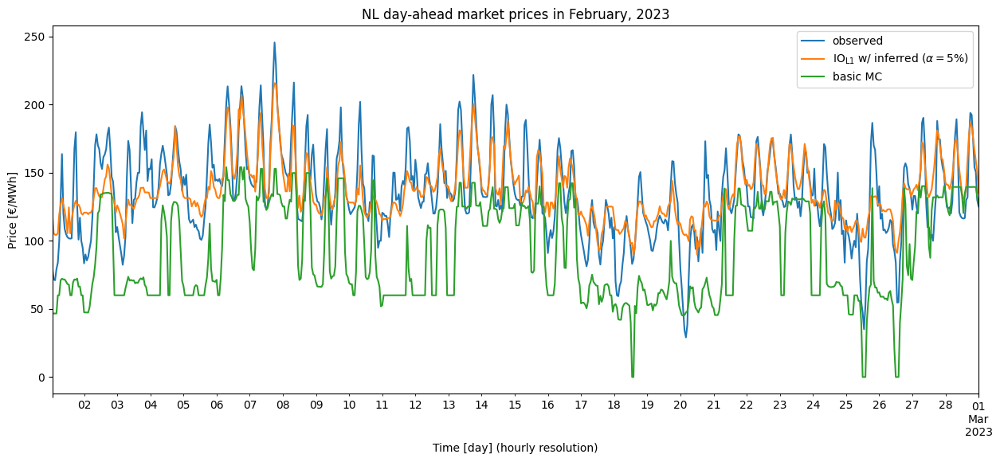

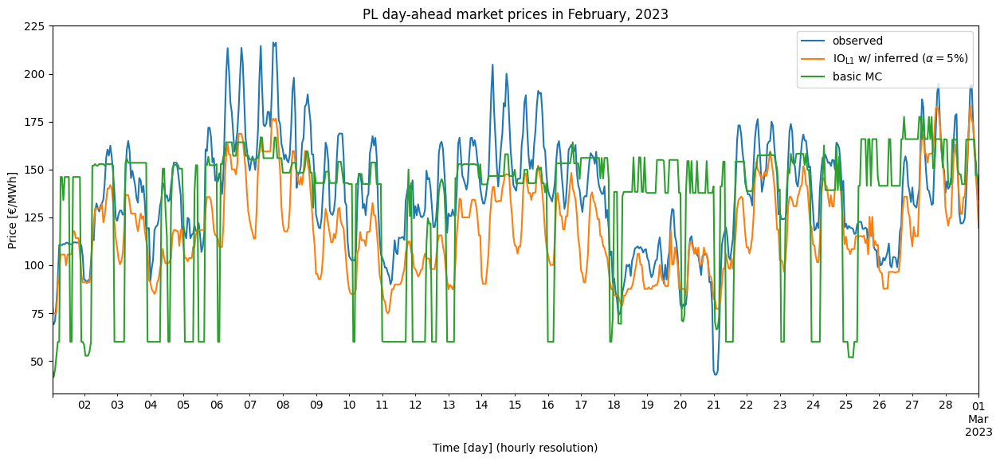

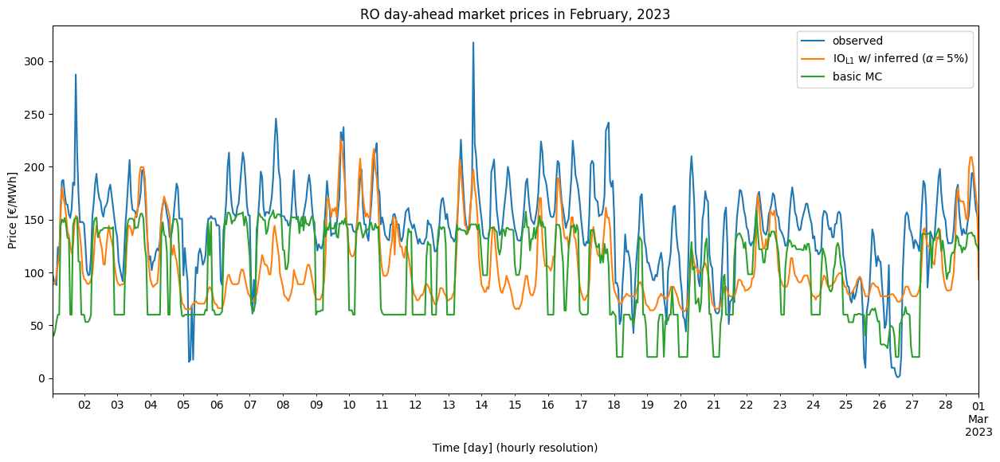

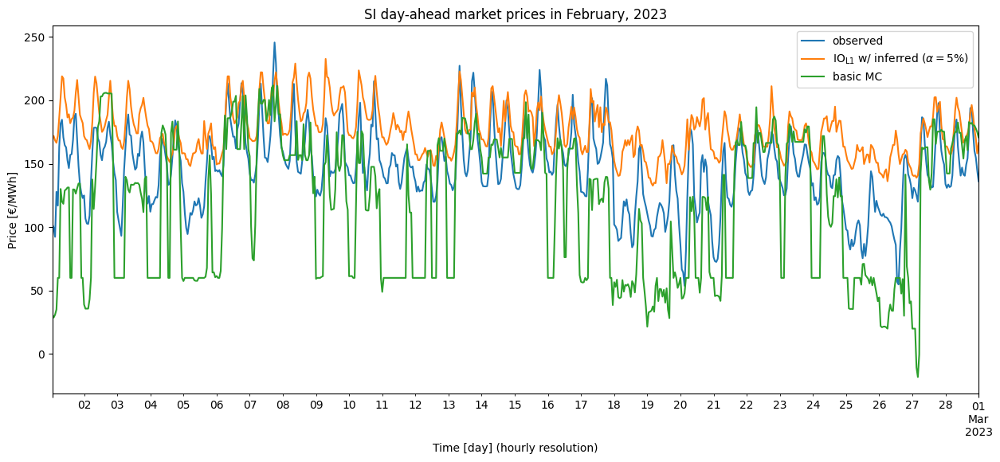

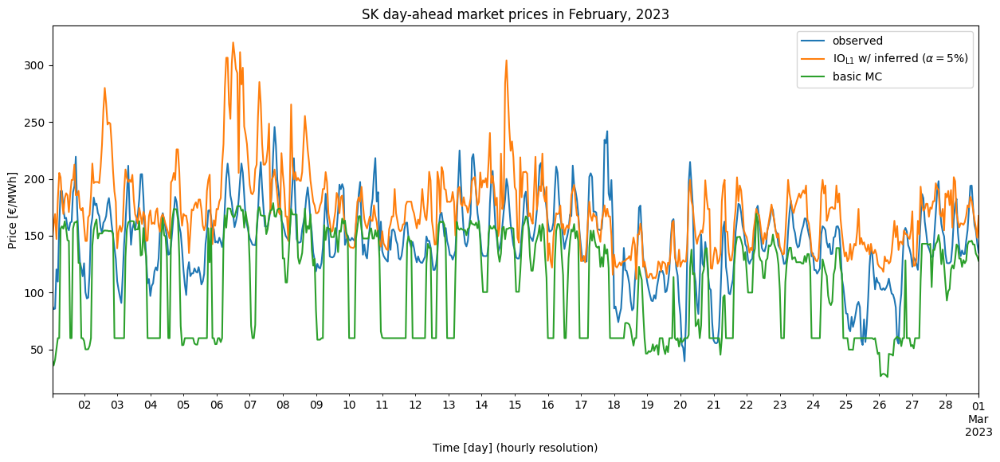

In [4]:
for zone in countries:
    plt.figure(figsize=(15,6))
    ax = df_observed_february[zone].plot()
    for df in [df_forecasts_february_alpha[1], df_forecasts_february[9]]:
        df[zone].plot(ax=ax)
    
    plt.title("{0} day-ahead market prices in February, 2023".format(zone))
    plt.ylabel('Price [€/MWh]')
    plt.xlabel('Time [day] (hourly resolution)')
    #ax.legend(['observed'] + forecast_legend)
    ax.legend(['observed', r'$\mathrm{IO_{L1}}$ w/ inferred ($\alpha = 5\%$)', 'basic MC'])
    plt.show()

Text(0, 0.5, 'MRE [%]')

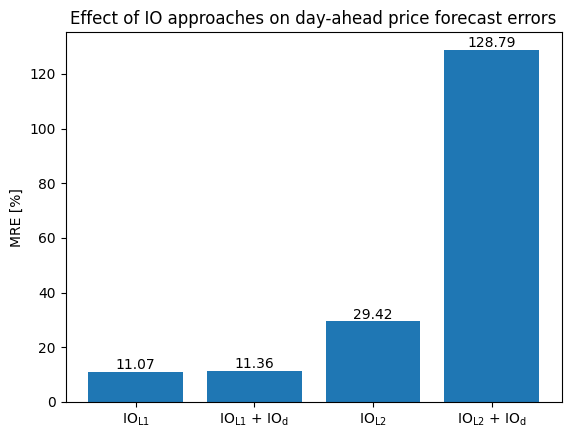

In [26]:
df_errors_l1 = df_forecasts_february[0][countries].copy()
df_errors_l1= df_errors_l1 - df_observed_february[countries]

df_errors_l1d = df_forecasts_february[1][countries].copy()
df_errors_l1d= df_errors_l1d - df_observed_february[countries]

df_errors_l2 = df_forecasts_february[2][countries].copy()
df_errors_l2= df_errors_l2 - df_observed_february[countries]

df_errors_l2d = df_forecasts_february[3][countries].copy()
df_errors_l2d = df_errors_l2 - df_observed_february[countries]

fig, ax = plt.subplots()
bars = ax.bar(forecast_legend, [
    abs(round(100*df_errors_l1.stack().abs().mean()/df_observed_february[countries].stack().mean(), 2)),
    abs(round(100*df_errors_l1d.stack().abs().mean()/df_observed_february[countries].stack().mean(), 2)),
    abs(round(100*df_errors_l2.stack().abs().mean()/df_observed_february[countries].stack().mean(), 2)),
    abs(round(100*df_errors_l2d.stack().abs().mean()/df_observed_february[countries].stack().mean(), 2))
])
ax.bar_label(bars)
plt.title(r'Effect of IO approaches on day-ahead price forecast errors')
ax.set_ylabel('MRE [%]')

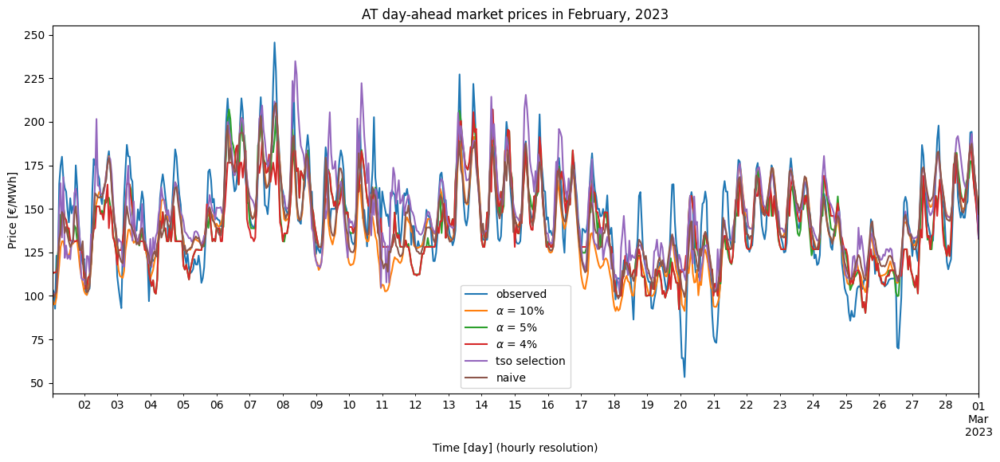

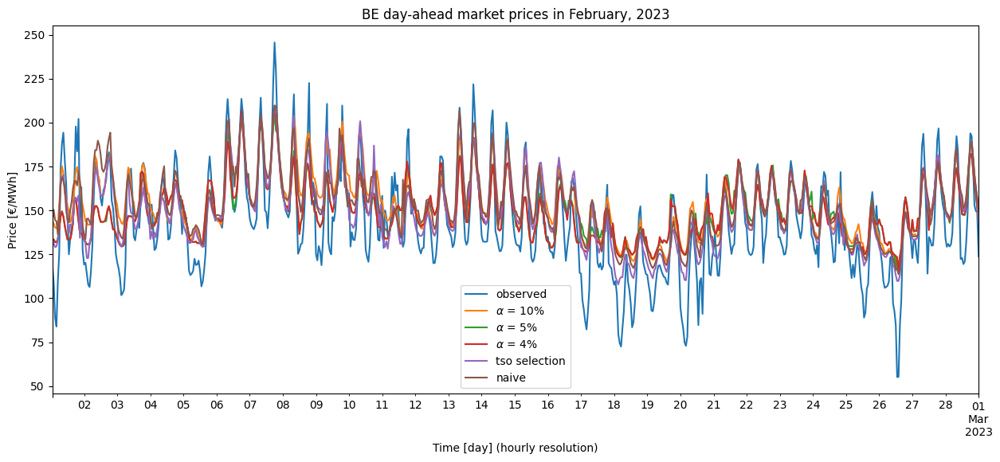

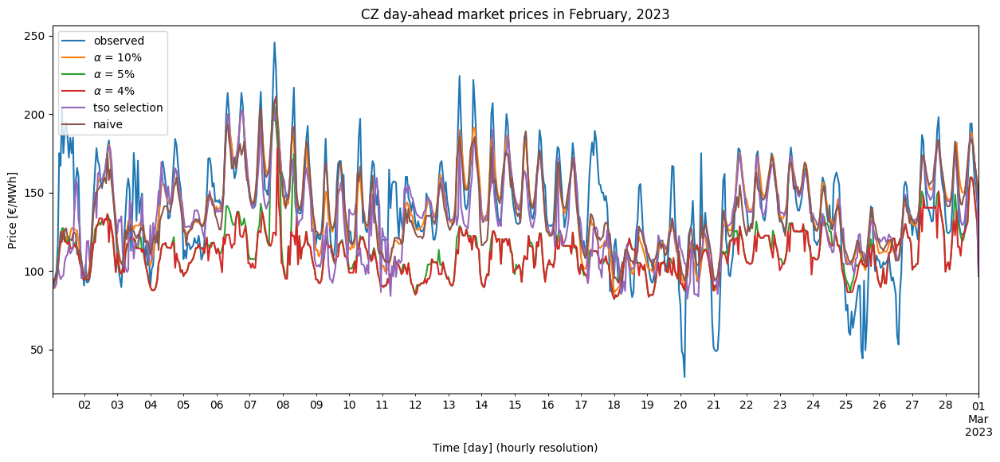

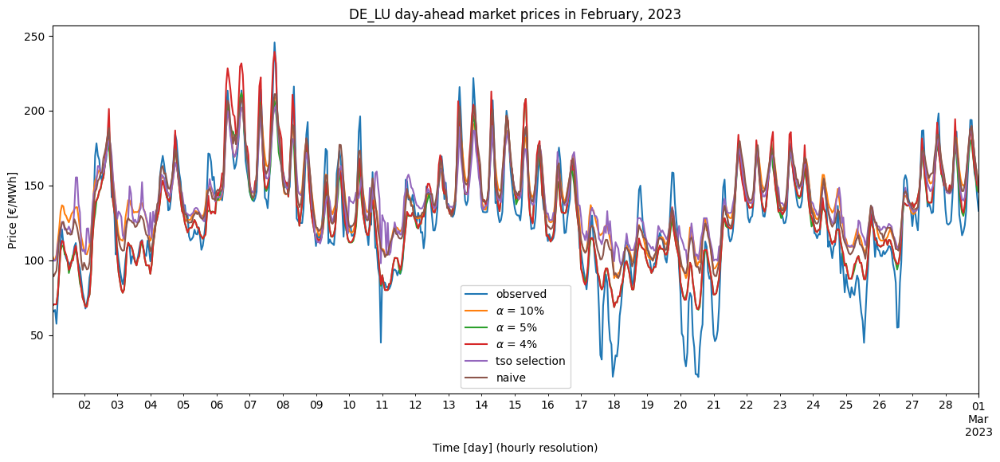

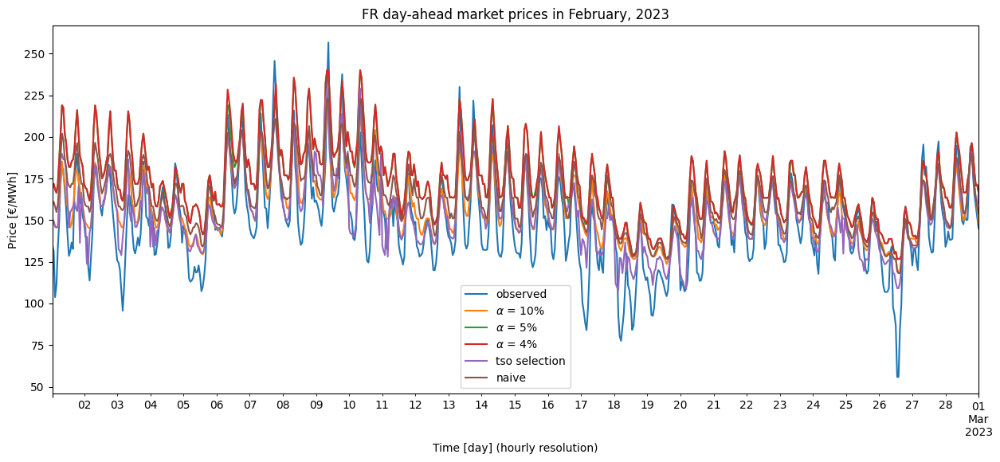

...

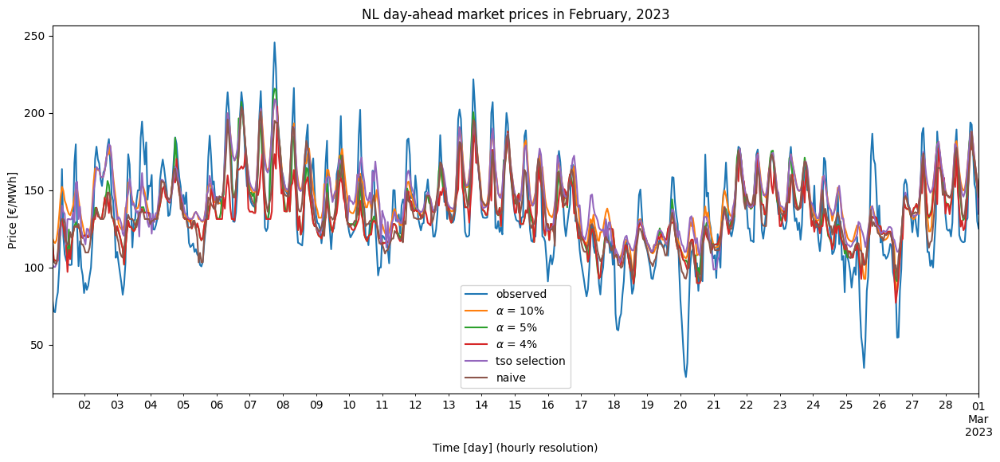

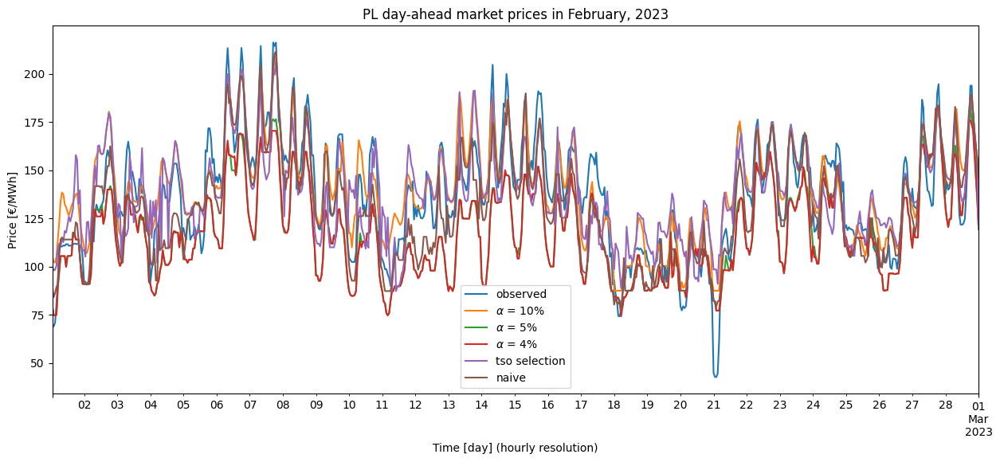

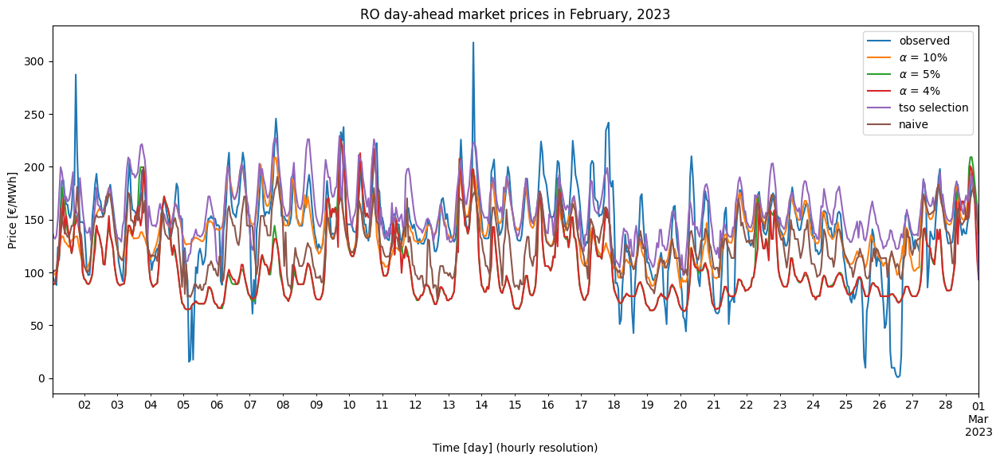

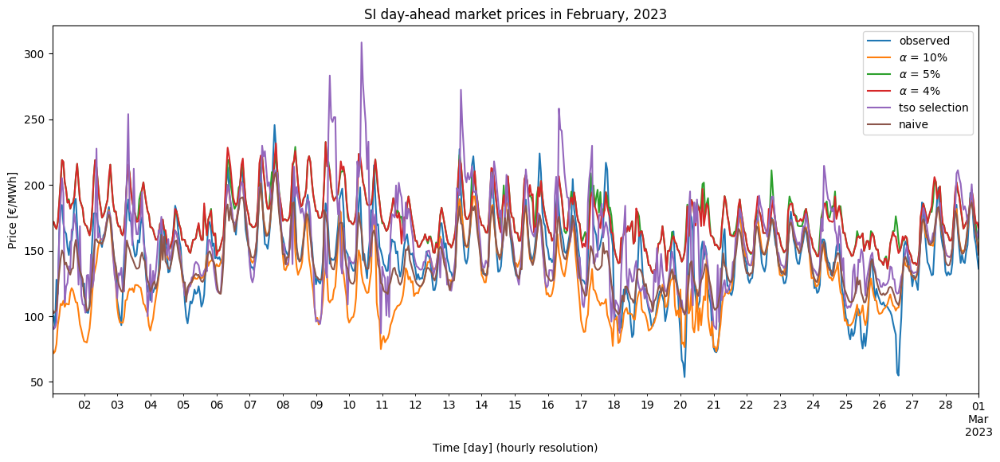

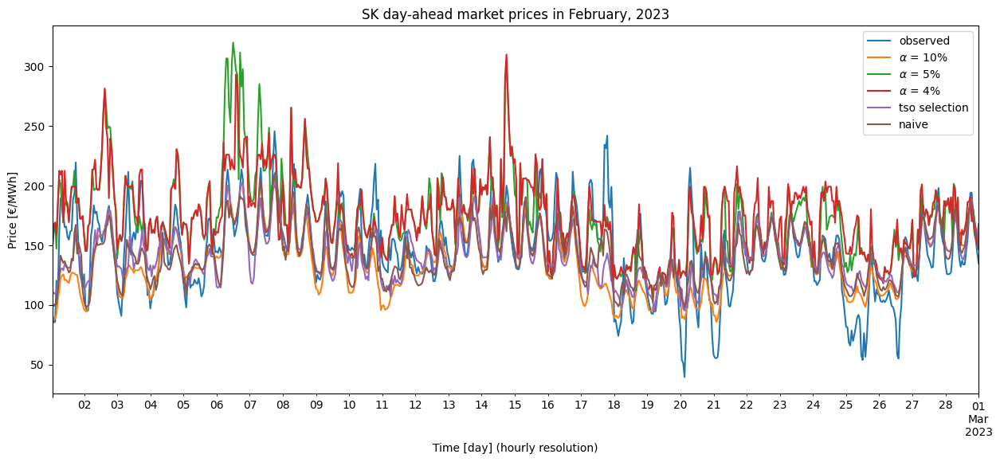

In [30]:
for zone in countries:
    plt.figure(figsize=(15,6))
    ax = df_observed_february[zone].plot()
    for df in df_forecasts_february_alpha:
        df[zone].plot(ax=ax)
    
    plt.title("{0} day-ahead market prices in February, 2023".format(zone))
    plt.ylabel('Price [€/MWh]')
    plt.xlabel('Time [day] (hourly resolution)')
    ax.legend(['observed'] + forecast_legend_alpha + ['naive'])
    plt.show()

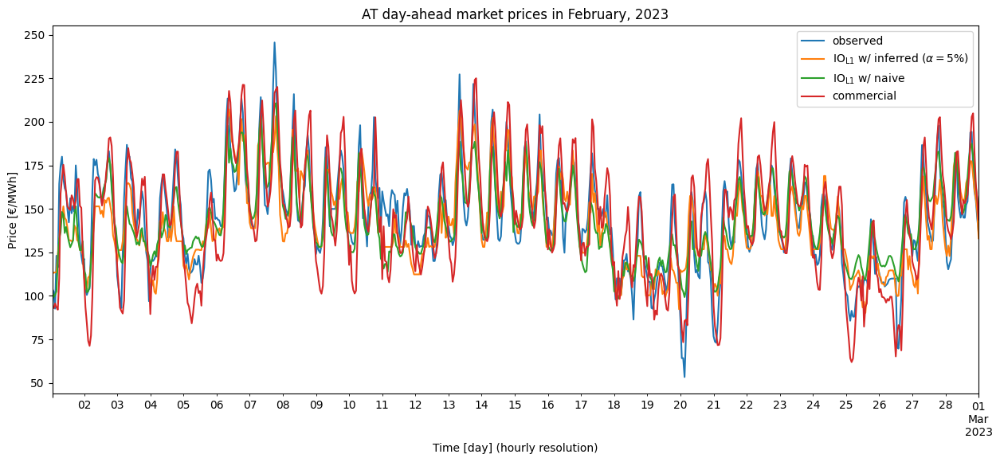

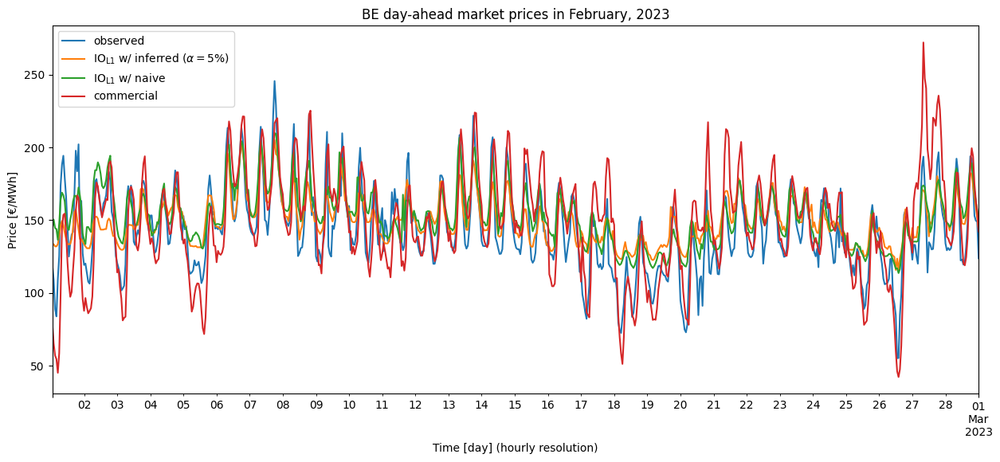

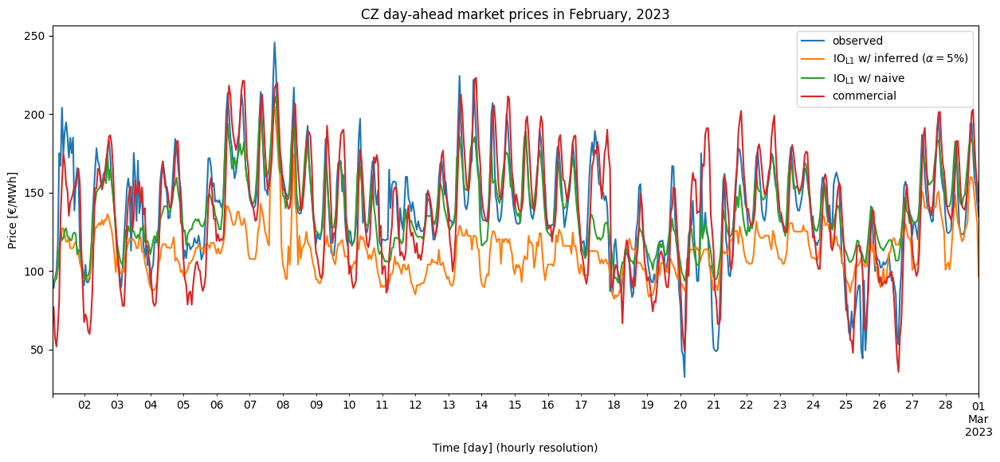

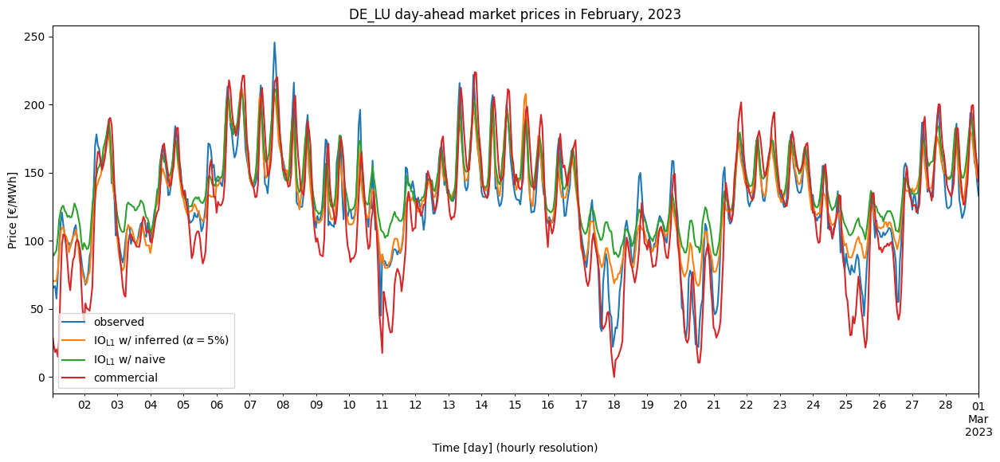

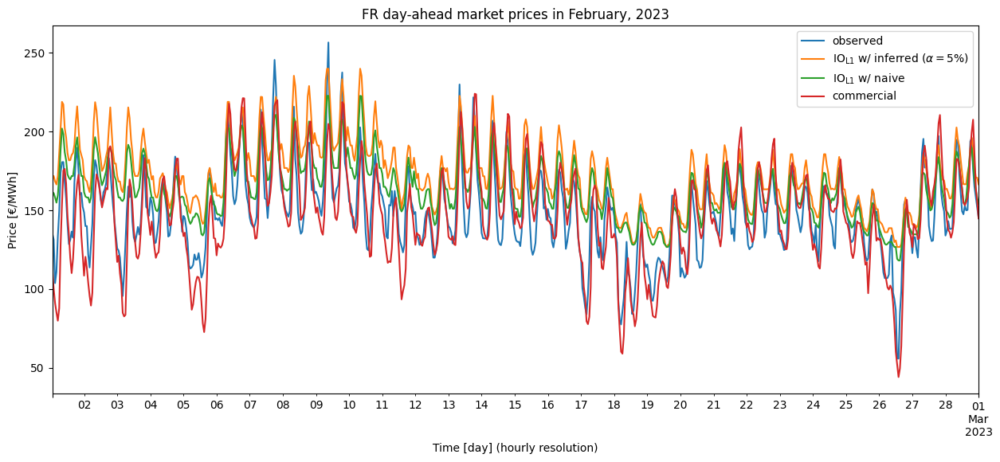

...

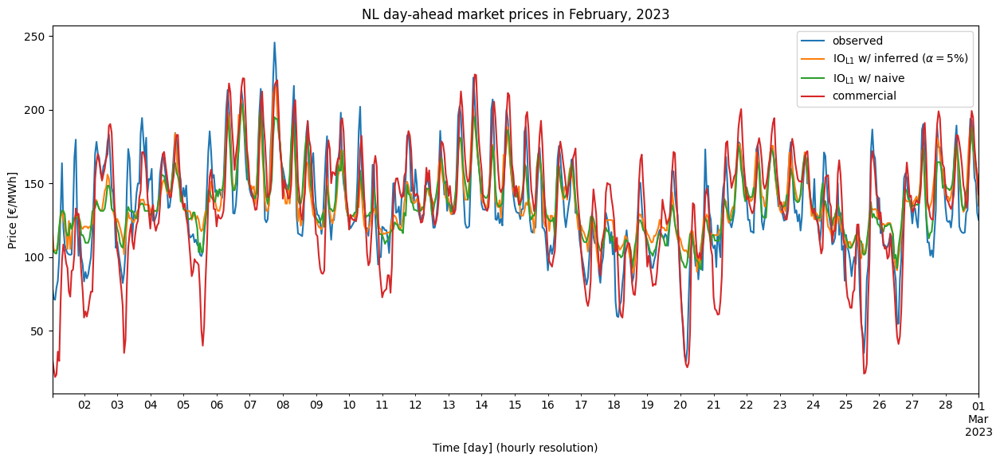

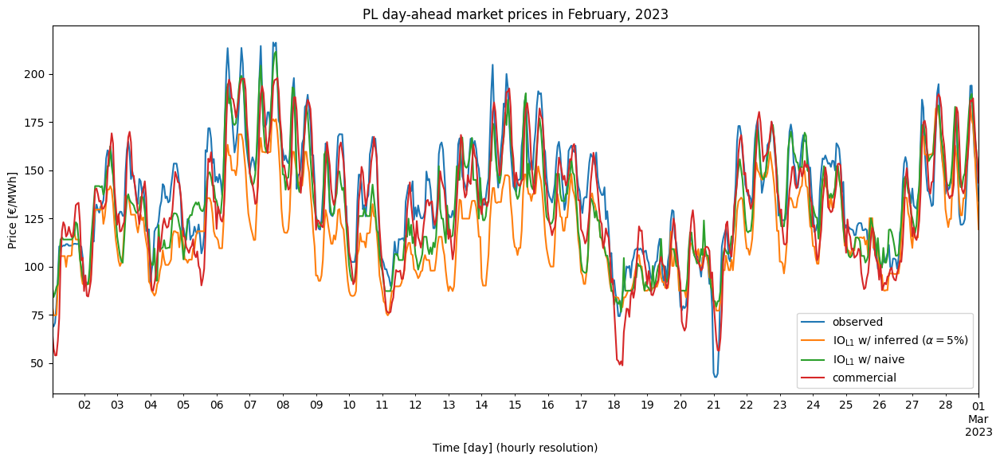

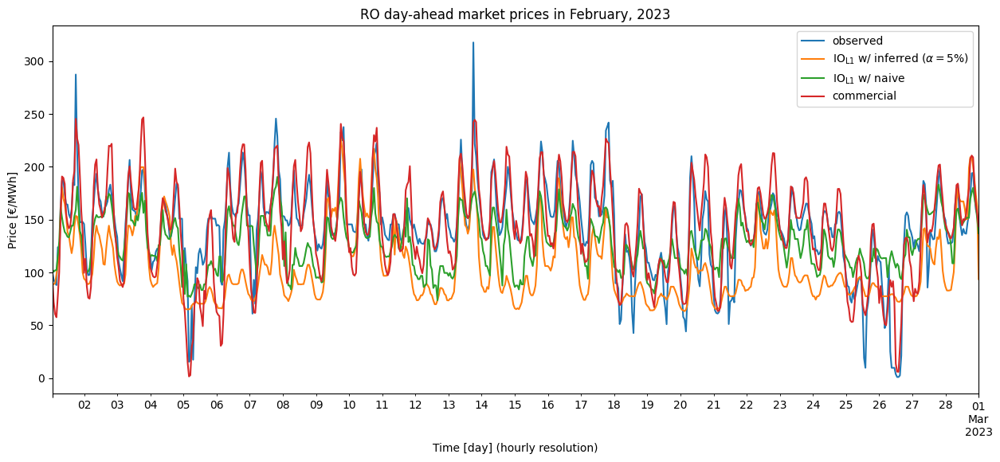

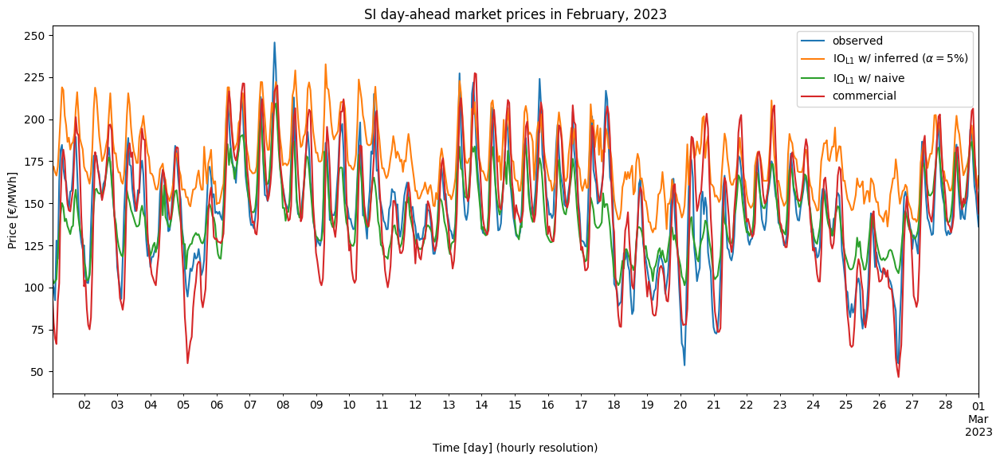

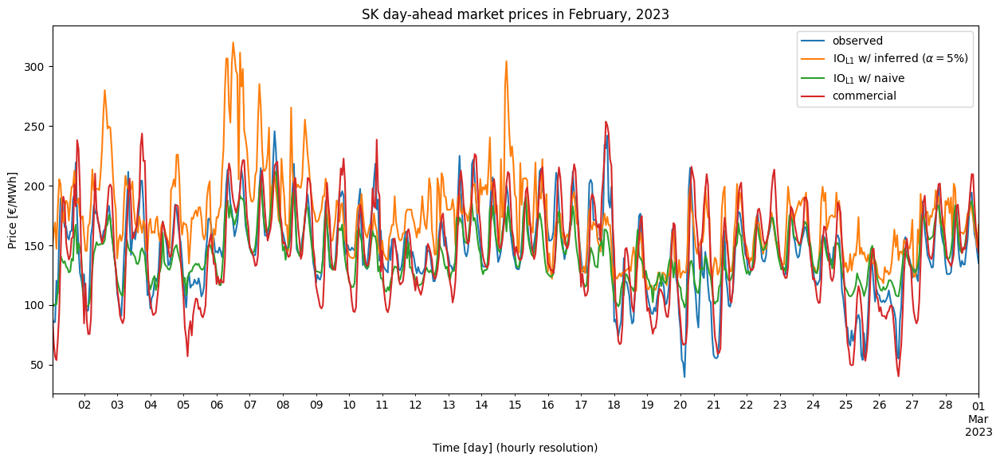

In [5]:
for zone in countries:
    plt.figure(figsize=(15,6))
    ax = df_observed_february[zone].plot()
    
    # inferred, naive, commercial
    #df_forecasts_february[6][zone].plot(ax=ax)
    df_forecasts_february_alpha[1][zone].plot(ax=ax)
    df_forecasts_february[7][zone].plot(ax=ax)
    df_forecasts_february[4][zone].plot(ax=ax)
    
    plt.title("{0} day-ahead market prices in February, 2023".format(zone))
    plt.ylabel('Price [€/MWh]')
    plt.xlabel('Time [day] (hourly resolution)')
    
    ax.legend(['observed', r'$\mathrm{IO_{L1}}$ w/ inferred ($\alpha = 5\%$)', r'$\mathrm{IO_{L1}}$ w/ naive', 'commercial'])
    #ax.legend(['observed', r'$\mathrm{IO_{L1}}$ w/ inferred ($\alpha = 5\%$)', 'commercial'])
    
    plt.show()

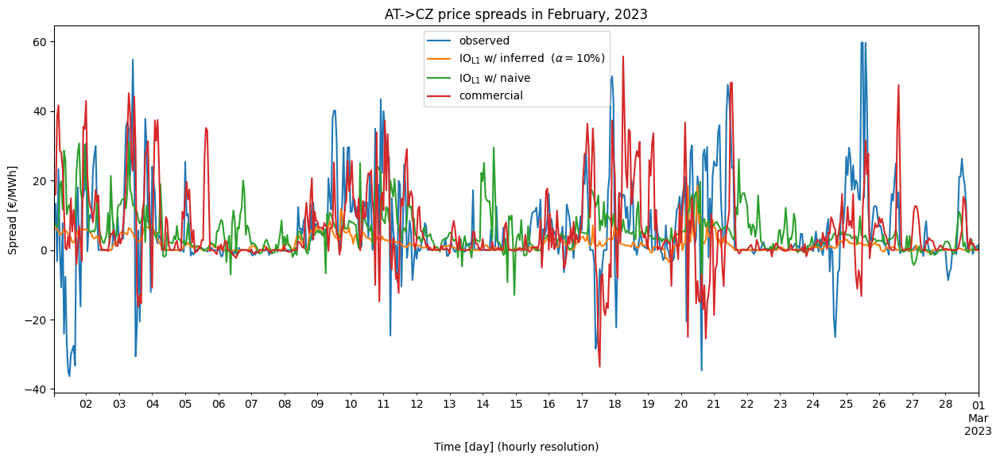

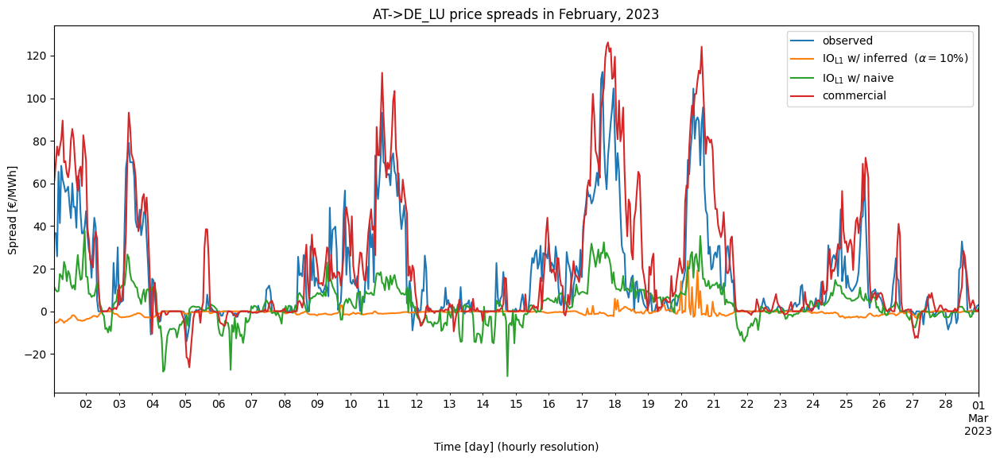

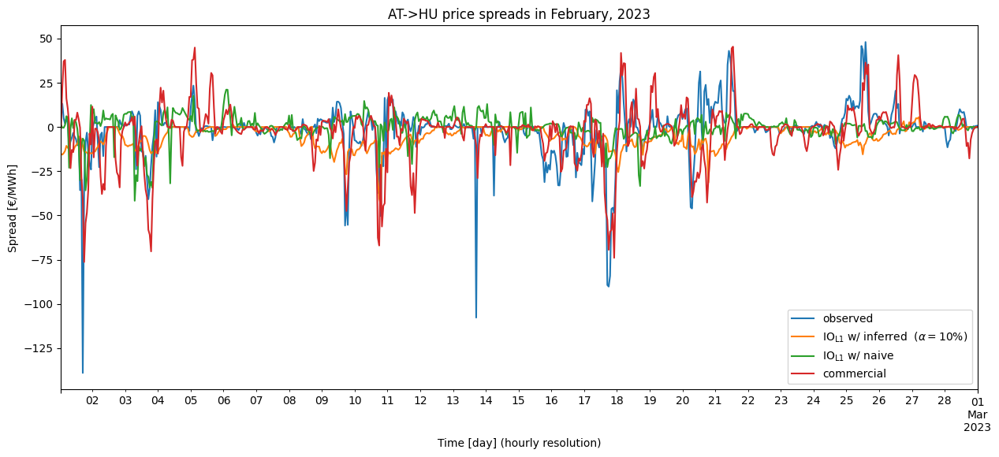

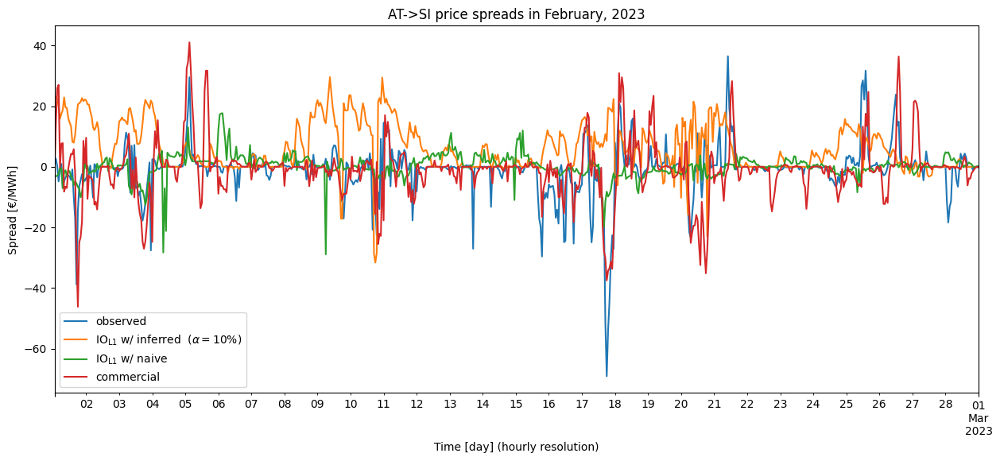

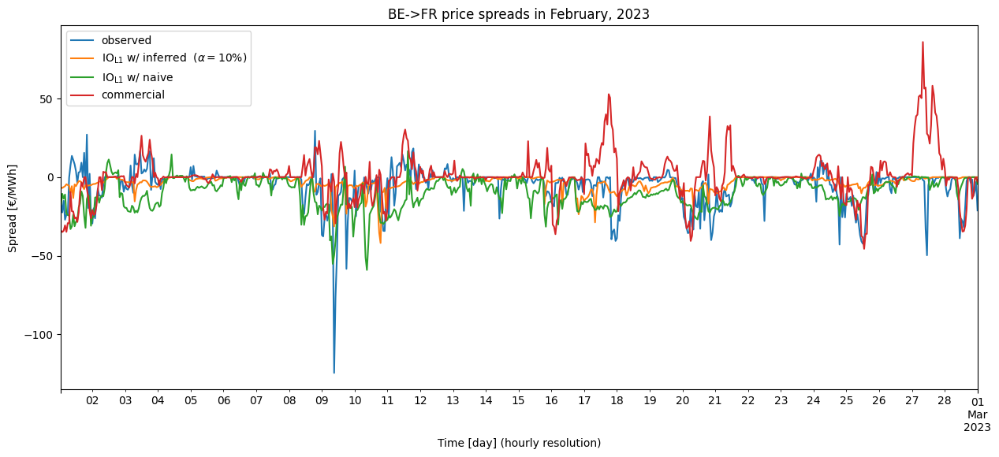

...

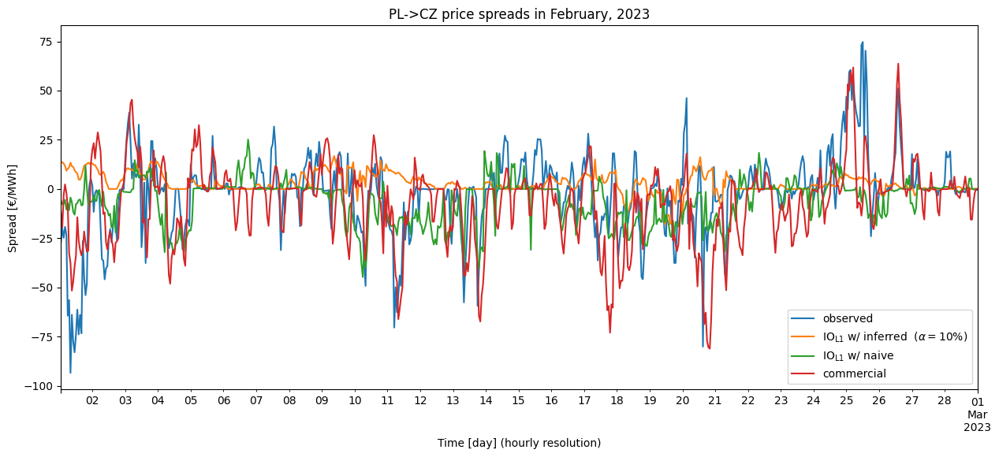

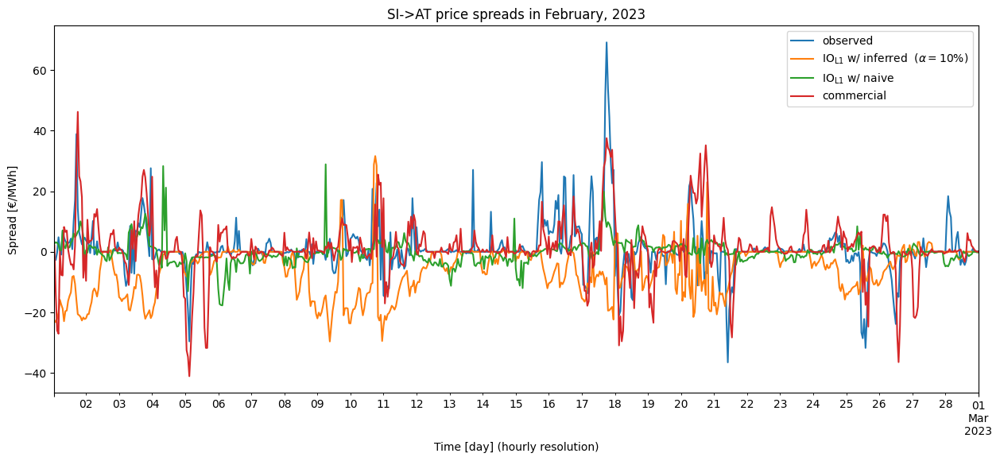

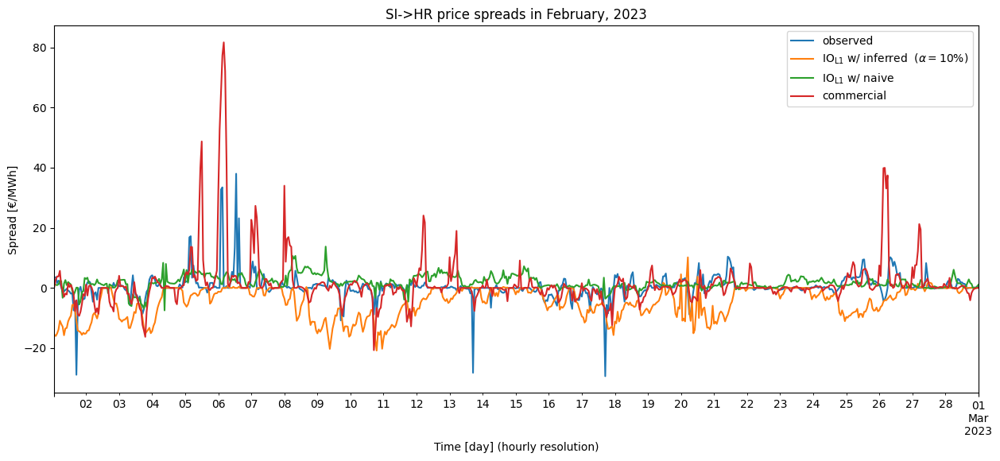

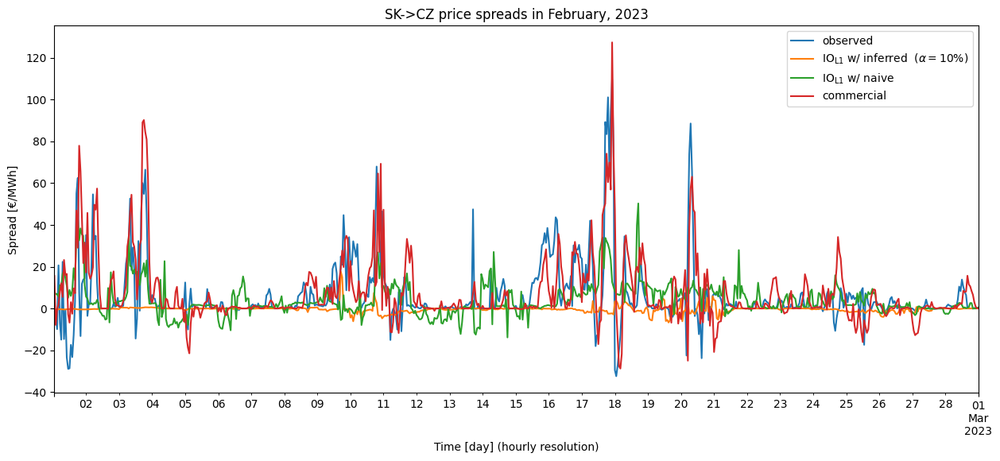

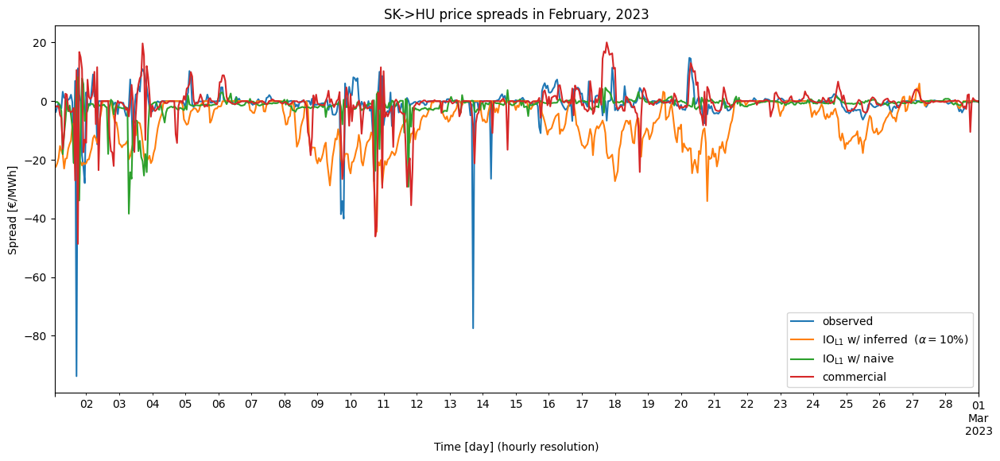

In [9]:
# NL-> DE

borders = [
    'AT-CZ', 'AT-DE', 'AT-HU', 'AT-SI', 'BE-FR', 'BE-NL', 'CZ-AT', 'CZ-DE', 
    'CZ-PL', 'CZ-SK', 'DE-AT', 'DE-CZ', 'DE-FR', 'DE-NL', 'FR-BE', 'FR-DE',
    'HR-HU', 'HR-SI', 'HU-AT', 'HU-HR', 'HU-SK', 'NL-BE', 'NL-DE', 'PL-CZ', 
    'SI-AT', 'SI-HR', 'SK-CZ', 'SK-HU'
]

for border in borders:
    z1 = border.split('-')[0]
    z2 = border.split('-')[1]
    z1 = z1.replace('DE', 'DE_LU')
    z2 = z2.replace('DE', 'DE_LU')
    
    df_ps_observed = df_observed_february[z1] - df_observed_february[z2] 
    df_ps_inferred = df_forecasts_february[6][z1] - df_forecasts_february[6][z2] 
    df_ps_naive = df_forecasts_february[7][z1] - df_forecasts_february[7][z2] 
    df_ps_volue = df_forecasts_february[4][z1] - df_forecasts_february[4][z2] 
    
    plt.figure(figsize=(15,6))
    ax = df_ps_observed.plot()
    df_ps_inferred.plot(ax=ax)
    df_ps_naive.plot(ax=ax)
    df_ps_volue.plot(ax=ax)
    
    plt.title("{0}->{1} price spreads in February, 2023".format(z1, z2))
    
    plt.ylabel('Spread [€/MWh]')
    plt.xlabel('Time [day] (hourly resolution)')

    ax.legend(['observed', r'$\mathrm{IO_{L1}}$ w/ inferred  ($\alpha = 10\%$)', r'$\mathrm{IO_{L1}}$ w/ naive', 'commercial'])

    plt.show()

In [40]:
# FORECAST ERROR ANALYSIS

df_errors_inferred = df_forecasts_february[6][countries].copy()
df_errors_inferred = df_errors_inferred - df_observed_february[countries]
df_errors_inferred_rel = df_errors_inferred/df_observed_february[countries]

df_errors_naive = df_forecasts_february[7][countries].copy()
df_errors_naive = df_errors_naive - df_observed_february[countries]
df_errors_naive_rel = df_errors_naive/df_observed_february[countries]

df_errors_vol = df_forecasts_february[4][countries].copy()
df_errors_vol = df_errors_vol - df_observed_february[countries]
df_errors_vol_rel = df_errors_vol/df_observed_february[countries]

In [69]:
print('L1 w/ inferred - MAE (€/MWh): {0} (std. {1})'.format(abs(round(df_errors_inferred.stack().abs().mean(), 2)), abs(round(df_errors_inferred.stack().abs().std(), 2))))
print('L1 w/ naive - MAE (€/MWh): {0} (std. {1})'.format(abs(round(df_errors_naive.stack().abs().mean(), 2)), abs(round(df_errors_naive.stack().abs().std(), 2))))
print('Commercial - MAE (€/MWh): {0} (std. {1})'.format(abs(round(df_errors_vol.stack().abs().mean(), 2)), abs(round(df_errors_vol.stack().abs().std(), 2))))

L1 w/ inferred - MAE (€/MWh): 15.18 (std. 15.26)
L1 w/ naive - MAE (€/MWh): 14.74 (std. 13.57)
Commercial - MAE (€/MWh): 15.94 (std. 13.37)


In [70]:
print('L1 w/ inferred - MRE_zone (%): {0} (std. {1})'.format(abs(round(100*df_errors_inferred_rel.stack().abs().mean(), 2)), abs(round(100*df_errors_inferred_rel.stack().abs().std(), 2))))
print('L1 w/ naive - MRE_zone (%): {0} (std. {1})'.format(abs(round(100*df_errors_naive_rel.stack().abs().mean(), 2)), abs(round(100*df_errors_naive_rel.stack().abs().std(), 2))))
print('Commercial - MRE_zone (%): {0} (std. {1})'.format(abs(round(100*df_errors_vol_rel.stack().abs().mean(), 2)), abs(round(100*df_errors_vol_rel.stack().abs().std(), 2))))

L1 w/ inferred - MRE_zone (%): 16.41 (std. 164.5)
L1 w/ naive - MRE_zone (%): 16.06 (std. 175.48)
Commercial - MRE_zone (%): 12.85 (std. 24.51)


In [41]:
print('L1 w/ inferred - MRE (%): {0} (std. {1})'.format(abs(round(100*df_errors_inferred.stack().abs().mean()/df_observed_february[countries].stack().mean(), 2)), abs(round(100*df_errors_inferred.abs().stack().std()/df_observed_february[countries].stack().mean(), 2))))
print('L1 w/ naive - MRE (%): {0} (std. {1})'.format(abs(round(100*df_errors_naive.stack().abs().mean()/df_observed_february[countries].stack().mean(), 2)), abs(round(100*df_errors_naive.stack().abs().std()/df_observed_february[countries].stack().mean(), 2))))
print('Commercial - MRE (%): {0} (std. {1})'.format(abs(round(100*df_errors_vol.stack().abs().mean()/df_observed_february[countries].stack().mean(), 2)), abs(round(100*df_errors_vol.stack().abs().std()/df_observed_february[countries].stack().mean(), 2))))


L1 w/ inferred - MRE (%): 10.71 (std. 10.77)
L1 w/ naive - MRE (%): 10.4 (std. 9.57)
Commercial - MRE (%): 11.24 (std. 9.43)


In [84]:
print('L1 - MRE_std (%): ', abs(round(100*df_errors_l1.stack().mean()/df_observed_february[countries].stack().std(), 2)))
print('Volue - MRE_std (%): ', abs(round(100*df_errors_vol.stack().mean()/df_observed_february[countries].stack().std(), 2)))


L1 - MRE_std (%):  12.02
Volue - MRE_std (%):  3.39


Text(0, 0.5, 'MRE [%]')

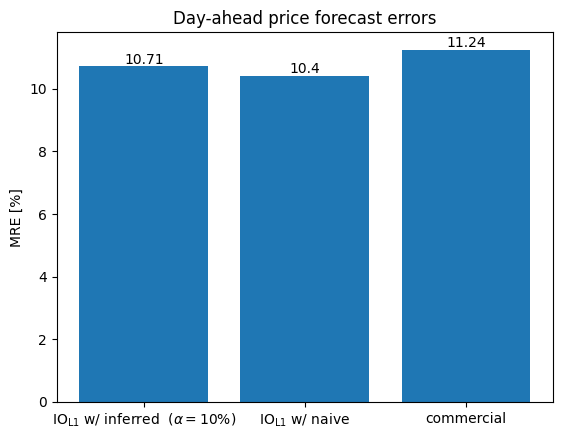

In [42]:
fig, ax = plt.subplots()
comm_bars = ax.bar([
    r'$\mathrm{IO_{L1}}$ w/ inferred  ($\alpha = 10\%$)',
    r'$\mathrm{IO_{L1}}$ w/ naive',
    r'commercial',
    ],
    [
        abs(round(100*df_errors_inferred.stack().abs().mean()/df_observed_february[countries].stack().mean(), 2)),
        abs(round(100*df_errors_naive.stack().abs().mean()/df_observed_february[countries].stack().mean(), 2)),
        abs(round(100*df_errors_vol.stack().abs().mean()/df_observed_february[countries].stack().mean(), 2))

    ],
)
"""
    yerr=[
        abs(round(100*df_errors_inferred.stack().abs().std()/df_observed_february[countries].stack().mean(), 2)),
        abs(round(100*df_errors_naive.stack().abs().std()/df_observed_february[countries].stack().mean(), 2)),
        abs(round(100*df_errors_vol.stack().abs().std()/df_observed_february[countries].stack().mean(), 2)) 
    ],
    capsize = 10
)
"""
ax.bar_label(comm_bars)
plt.title(r'Day-ahead price forecast errors')
ax.set_ylabel('MRE [%]')

Text(0, 0.5, 'Relative error [%]')

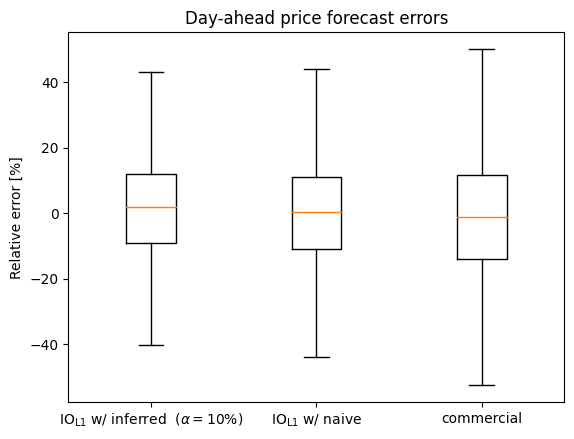

In [14]:
fig, ax = plt.subplots()
ax.boxplot([
    list(df_errors_inferred.stack()),
    list(df_errors_naive.stack()),
    list(df_errors_vol.stack()),
], showfliers=False)
ax.set_xticklabels([
    r'$\mathrm{IO_{L1}}$ w/ inferred  ($\alpha = 10\%$)',
    r'$\mathrm{IO_{L1}}$ w/ naive',
    r'commercial',
])
plt.title(r'Day-ahead price forecast errors')
ax.set_ylabel('Relative error [%]')

In [72]:
df_errors_inferred.mean().abs()

AT        5.367760
BE       10.406548
CZ        1.679520
DE_LU    11.456359
FR        8.603756
HR        7.406387
HU        1.678785
NL        9.517372
PL        3.642783
RO        2.937035
SI       12.625918
SK        8.300538
dtype: float64

In [73]:
df_errors_naive.mean().abs()

AT        2.091270
BE        9.288212
CZ        2.086241
DE_LU    10.480049
FR       14.244840
HR        4.543670
HU        3.411613
NL        1.038963
PL        6.139902
RO       14.436964
SI        3.182475
SK        4.067253
dtype: float64

In [74]:
df_errors_vol.mean().abs()

AT       0.676890
BE       3.426548
CZ       0.918973
DE_LU    5.696533
FR       2.270372
HR       1.542545
HU       0.479807
NL       0.125179
PL       5.673423
RO       0.459137
SI       0.509955
SK       0.399658
dtype: float64

Text(0.5, 0.98, 'Day-ahead market price forecast errors in February, 2023')

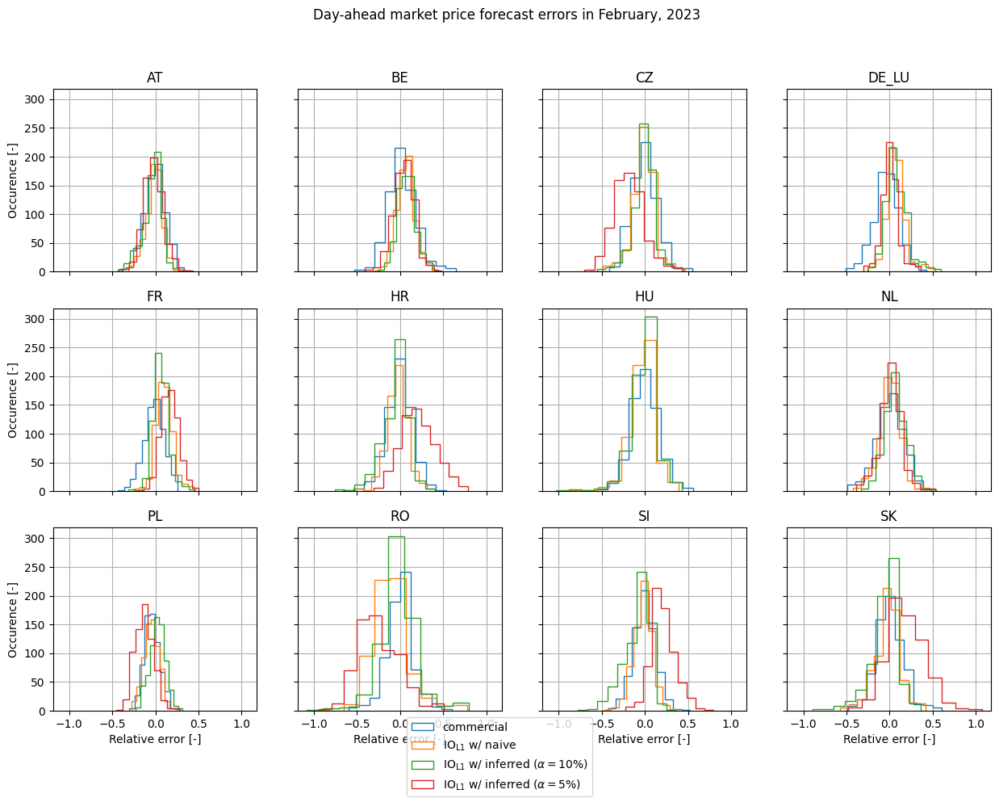

In [52]:
fig, axs = plt.subplots(3, 4, sharey=True, sharex=True, figsize=(15, 10))
zone_axs = [
    axs[0, 0], axs[0, 1], axs[0, 2], axs[0, 3],
    axs[1, 0], axs[1, 1], axs[1, 2], axs[1, 3],
    axs[2, 0], axs[2, 1], axs[2, 2], axs[2, 3],
]

for index, zone in enumerate(countries):
    (df_errors_vol[zone]/df_observed_february[countries].stack().mean()).hist(ax=zone_axs[index], histtype='step')
    (df_errors_naive[zone]/df_observed_february[countries].stack().mean()).hist(ax=zone_axs[index], histtype='step')
    (df_errors_inferred[zone]/df_observed_february[countries].stack().mean()).hist(ax=zone_axs[index], histtype='step')
    if zone != "HU":
        (df_errors_alpha5[zone]/df_observed_february[countries].stack().mean()).hist(ax=zone_axs[index], histtype='step')
    zone_axs[index].set_title(zone)
    
for ax in axs.flat:
    ax.set(xlabel='Relative error [-]', ylabel='Occurence [-]')

for ax in axs.flat:
    ax.label_outer()

fig.legend([
    'commercial',
    r'$\mathrm{IO_{L1}}$ w/ naive',
    r'$\mathrm{IO_{L1}}$ w/ inferred ($\alpha = 10\%$)',
    r'$\mathrm{IO_{L1}}$ w/ inferred ($\alpha = 5\%$)',
], loc='lower center')
fig.suptitle('Day-ahead market price forecast errors in February, 2023')

alpha = 10% - MRE (%): 10.71 (std. 10.77)
alpha = 5% - MRE (%): 23.13 (std. 28.21)
alpha = 4% - MRE (%): 23.83 (std. 29.26)
tso selection - MRE (%): 14.74 (std. 18.65)
naive - MRE (%): 10.4 (std. 9.57)


Text(0, 0.5, 'MRE [%]')

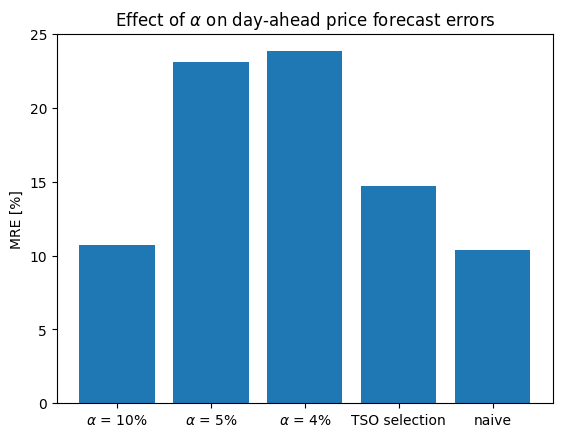

In [48]:
# FORECAST ERROR SENSITIVITY TO ALPHA

reduced_countries = countries
#reduced_countries = ["AT", "DE_LU", "NL"]

df_errors_alpha10 = df_forecasts_february_alpha[0][reduced_countries].copy()
df_errors_alpha10 = df_errors_alpha10 - df_observed_february[reduced_countries]

df_errors_alpha5 = df_forecasts_february_alpha[1][reduced_countries].copy()
df_errors_alpha5 = df_errors_alpha5 - df_observed_february[countries]

df_errors_alpha4 = df_forecasts_february_alpha[2][reduced_countries].copy()
df_errors_alpha4 = df_errors_alpha4 - df_observed_february[reduced_countries]

df_errors_tso = df_forecasts_february_alpha[3][reduced_countries].copy()
df_errors_tso = df_errors_tso - df_observed_february[reduced_countries]

df_errors_naive = df_forecasts_february_alpha[4][reduced_countries].copy()
df_errors_naive = df_errors_naive - df_observed_february[reduced_countries]

print('alpha = 10% - MRE (%): {0} (std. {1})'.format(abs(round(100*df_errors_alpha10.stack().abs().mean()/df_observed_february[countries].stack().mean(), 2)), abs(round(100*df_errors_alpha10.abs().stack().std()/df_observed_february[countries].stack().mean(), 2))))
print('alpha = 5% - MRE (%): {0} (std. {1})'.format(abs(round(100*df_errors_alpha5.stack().abs().mean()/df_observed_february[countries].stack().mean(), 2)), abs(round(100*df_errors_alpha5.stack().abs().std()/df_observed_february[countries].stack().mean(), 2))))
print('alpha = 4% - MRE (%): {0} (std. {1})'.format(abs(round(100*df_errors_alpha4.stack().abs().mean()/df_observed_february[countries].stack().mean(), 2)), abs(round(100*df_errors_alpha4.stack().abs().std()/df_observed_february[countries].stack().mean(), 2))))
print('tso selection - MRE (%): {0} (std. {1})'.format(abs(round(100*df_errors_tso.stack().abs().mean()/df_observed_february[countries].stack().mean(), 2)), abs(round(100*df_errors_tso.stack().abs().std()/df_observed_february[countries].stack().mean(), 2))))
print('naive - MRE (%): {0} (std. {1})'.format(abs(round(100*df_errors_naive.stack().abs().mean()/df_observed_february[countries].stack().mean(), 2)), abs(round(100*df_errors_naive.stack().abs().std()/df_observed_february[countries].stack().mean(), 2))))

fig, ax = plt.subplots()
ax.bar([
    r'$\alpha$ = 10%',
    r'$\alpha$ = 5%',
    r'$\alpha$ = 4%',
    'TSO selection',
    'naive',
], [
    abs(round(100*df_errors_alpha10.stack().abs().mean()/df_observed_february[countries].stack().mean(), 2)),
    abs(round(100*df_errors_alpha5.stack().abs().mean()/df_observed_february[countries].stack().mean(), 2)),
    abs(round(100*df_errors_alpha4.stack().abs().mean()/df_observed_february[countries].stack().mean(), 2)),
    abs(round(100*df_errors_tso.stack().abs().mean()/df_observed_february[countries].stack().mean(), 2)),
    abs(round(100*df_errors_naive.stack().abs().mean()/df_observed_february[countries].stack().mean(), 2))
])
plt.title(r'Effect of $\alpha$ on day-ahead price forecast errors')
ax.set_ylabel('MRE [%]')

Text(0, 0.5, 'MRE [%]')

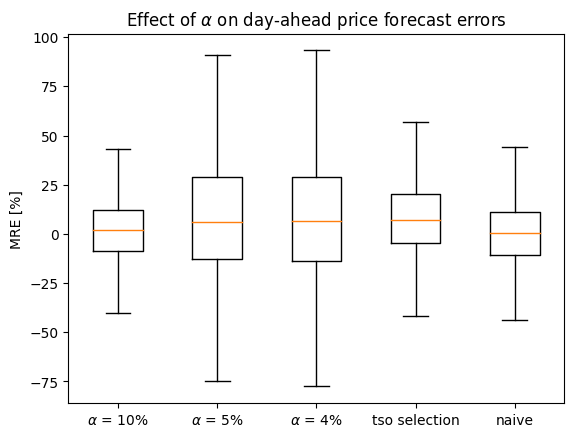

In [5]:
fig, ax = plt.subplots()
ax.boxplot([
    list(df_errors_alpha10.stack()),
    list(df_errors_alpha5.stack()),
    list(df_errors_alpha4.stack()),
    list(df_errors_tso.stack()),
    list(df_errors_naive.stack()),
], showfliers=False)
ax.set_xticklabels([
    r'$\alpha$ = 10%',
    r'$\alpha$ = 5%',
    r'$\alpha$ = 4%',
    'tso selection',
    'naive'
])
plt.title(r'Effect of $\alpha$ on day-ahead price forecast errors')
ax.set_ylabel('MRE [%]')